In [1]:
import torch
import torch.nn as nn
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import re
from sklearn.utils import class_weight

import pandas as pd
import os
import seaborn as sns
from sklearn.utils import shuffle
import matplotlib.pyplot as plt
import shutil

In [2]:
root_path = os.getcwd()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


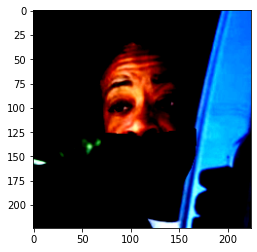

In [3]:
filename = root_path +"/LFW_Dataset/Masked_LFW_Dataset/Masked_LFW_Dataset/Al_Sharpton_0001.jpg"
input_image = Image.open(filename)

preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_tensor = preprocess(input_image)
input_batch = input_tensor.unsqueeze(0)

plt.imshow(torch.swapaxes(torch.swapaxes(input_tensor, 0, 2), 0, 1))
plt.show()

### Data Loading

In [4]:
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision.datasets import ImageFolder

-----------------------------------------------------------------

**Comment:** to prevent data leakage, we will use same data splits used in the Task 1 (classifiers evaluation)

In [5]:
## Load dataset
train_test_settings = os.path.join(root_path, "split.parquet")
df_all = pd.read_parquet(train_test_settings)

In [6]:
def change_root_path(dataframe, new_path):
    "New path should start and end with '/'"
    df = dataframe.copy()
    df['fullpath'] = df['fullpath'].apply(lambda x: x.replace("/content/unzipped_archive/", new_path))
    return df

In [7]:
dset_path = os.path.join(root_path, "LFW_Dataset/")

In [8]:
df_all = change_root_path(df_all, dset_path)

In [9]:
df_all

,fullpath,filename,isMasked,person,personImg,isTrain
0,/home/imad/CycleGAN/LFW_Dataset/LFW_without_Ma...,Abdullah_Gul_0005.jpg,False,Abdullah Gul,0005,True
1,/home/imad/CycleGAN/LFW_Dataset/LFW_without_Ma...,Abdullah_Gul_0003.jpg,False,Abdullah Gul,0003,False
2,/home/imad/CycleGAN/LFW_Dataset/LFW_without_Ma...,Abdullah_Gul_0001.jpg,False,Abdullah Gul,0001,True
3,/home/imad/CycleGAN/LFW_Dataset/LFW_without_Ma...,Abdullah_Gul_0004.jpg,False,Abdullah Gul,0004,True
4,/home/imad/CycleGAN/LFW_Dataset/LFW_without_Ma...,Abdullah_Gul_0002.jpg,False,Abdullah Gul,0002,False
...,...,...,...,...,...,...
4112,/home/imad/CycleGAN/LFW_Dataset/Masked_LFW_Dat...,Zinedine_Zidane_0004.jpg,True,Zinedine Zidane,0004,True
4113,/home/imad/CycleGAN/LFW_Dataset/Masked_LFW_Dat...,Zinedine_Zidane_0005.jpg,True,Zinedine Zidane,0005,False
4114,/home/imad/CycleGAN/LFW_Dataset/Masked_LFW_Dat...,Zinedine_Zidane_0002.jpg,True,Zinedine Zidane,0002,True
4115,/home/imad/CycleGAN/LFW_Dataset/Masked_LFW_Dat...,Zinedine_Zidane_0003.jpg,True,Zinedine Zidane,0003,True


#### Prepare subset

In [10]:
df_train = df_all[df_all["isTrain"]]
df_train_masked = df_train[df_train["isMasked"]]    #trainB
df_train_naked = df_train[~df_train["isMasked"]]    #trainA

trainA = df_train_naked
trainB = df_train_masked

In [11]:
df_test = df_all[~df_all["isTrain"]]
df_test_masked = df_test[df_test["isMasked"]]       #testB
df_test_naked = df_test[~df_test["isMasked"]]       #testA

testA = df_test_naked
testB = df_test_masked

#### Saving the different sub-datasets

CycleGAN models requires trainA, trainB folders to create two generators *from distribution A to distribution B* and vice-versa

In [12]:
save_path = root_path + "/pytorch-CycleGAN-and-pix2pix/datasets/LFW_dataset"

In [13]:
print("\t Train A: {}, Train B: {}, Test A: {}, Test B: {}".format(len(df_train_naked), len(df_train_masked), len(df_test_naked), len(df_test_masked)))

	 Train A: 1269, Train B: 1202, Test A: 846, Test B: 800


In [37]:
subset = "trainA"  #Unmasked
counter = 0
try:
    new_folder = save_path + "/" + subset
    os.mkdir(new_folder)
except:
    print("Already exist!")
    
for index, row in trainA.iterrows():
    path = row["fullpath"]
    splitted = path.split('/')
    target = os.path.join(save_path, subset, splitted[-1])

    shutil.copyfile(path, target)
    counter += 1
print("\t trainA: ", counter)

Already exist!
	 trainA:  1269


In [38]:
subset = "testA"
counter = 0
try:
    new_folder = save_path + "/" + subset
    os.mkdir(new_folder)
except:
    print("Already exist!")
    
for index, row in testA.iterrows():
    path = row["fullpath"]
    splitted = path.split('/')
    target = os.path.join(save_path, subset, splitted[-1])

    shutil.copyfile(path, target)
    counter += 1
print("\t testA: ", counter)

Already exist!
	 testA:  846


In [40]:
subset = "trainB"   #Masked
counter = 0
try:
    new_folder = save_path + "/" + subset
    os.mkdir(new_folder)
except:
    print("Already exist!")

for idx, row in trainB.iterrows():
    path = row["fullpath"]
    splitted = path.split('/')
    target = os.path.join(save_path, subset, splitted[-1])

    shutil.copyfile(path, target)
    counter += 1
print("\t trainB: ", counter)

Already exist!
	 trainB:  1202


In [41]:
subset = "testB"
counter = 0
try:
    new_folder = save_path + "/" + subset
    os.mkdir(new_folder)
except:
    print("Already exist!")
    
for idx, row in testB.iterrows():
    path = row["fullpath"]
    splitted = path.split('/')
    target = os.path.join(save_path, subset, splitted[-1])
    
    shutil.copyfile(path, target)
    counter += 1
print("\t testB: ", counter)

Already exist!
	 testB:  800


### Evaluation Classifier on Fake Data

>- General Model: trained on both masked and naked faces

In [203]:
type_model = "new_resnet_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "general.pt"
model_path = os.path.join(dir_pretrained, model_name)

model, scores, history = torch.load(model_path)

In [204]:
## Results from CycleGAN
cycle_gan_folder = "pytorch-CycleGAN-and-pix2pix"
dataset = "LFW Dataset"
model_trained = "mask2unmask_final2"
masked_to_unmasked = os.path.join(root_path, cycle_gan_folder, "results", model_trained, "test_latest_Masked_toUnmasked")
unmasked_to_masked = os.path.join(root_path, cycle_gan_folder, "results", model_trained, "test_latest_Unmasked_toMasked")

In [205]:
from torch.utils.data import Dataset
from torchvision.io import read_image

data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224, scale=(.7, 1.)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

In [206]:
name_to_idx = {'Abdullah Gul': 281, 'Adrien Brody': 82, 'Ahmed Chalabi': 40,
 'Ai Sugiyama': 193,
 'Al Gore': 110,
 'Al Sharpton': 230,
 'Alan Greenspan': 123,
 'Alastair Campbell': 205,
 'Albert Costa': 216,
 'Alejandro Toledo': 234,
 'Ali Naimi': 208,
 'Allyson Felix': 319,
 'Alvaro Uribe': 264,
 'Amelia Vega': 15,
 'Amelie Mauresmo': 332,
 'Ana Guevara': 240,
 'Ana Palacio': 303,
 'Andre Agassi': 383,
 'Andy Roddick': 45,
 'Angela Bassett': 3,
 'Angela Merkel': 50,
 'Angelina Jolie': 346,
 'Ann Veneman': 356,
 'Anna Kournikova': 149,
 'Antonio Banderas': 256,
 'Antonio Palocci': 76,
 'Ari Fleischer': 297,
 'Ariel Sharon': 288,
 'Arminio Fraga': 113,
 'Arnold Schwarzenegger': 365,
 'Arnoldo Aleman': 238,
 'Ashanti': 414,
 'Atal Bihari Vajpayee': 112,
 'Ben Affleck': 201,
 'Benazir Bhutto': 172,
 'Benjamin Netanyahu': 27,
 'Bernard Law': 183,
 'Bertie Ahern': 168,
 'Bill Clinton': 203,
 'Bill Frist': 243,
 'Bill Gates': 382,
 'Bill Graham': 272,
 'Bill McBride': 13,
 'Bill Simon': 23,
 'Billy Crystal': 143,
 'Binyamin Ben-Eliezer': 337,
 'Bob Graham': 257,
 'Bob Hope': 381,
 'Bob Stoops': 67,
 'Boris Becker': 120,
 'Brad Johnson': 61,
 'Britney Spears': 293,
 'Bulent Ecevit': 389,
 'Calista Flockhart': 135,
 'Cameron Diaz': 192,
 'Carla Del Ponte': 329,
 'Carlos Menem': 279,
 'Carlos Moya': 174,
 'Carmen Electra': 65,
 'Carrie-Anne Moss': 354,
 'Catherine Deneuve': 43,
 'Catherine Zeta-Jones': 361,
 'Celine Dion': 188,
 'Cesar Gaviria': 196,
 'Chanda Rubin': 74,
 'Charles Moose': 200,
 'Charles Taylor': 176,
 'Charlton Heston': 144,
 'Chen Shui-bian': 343,
 'Choi Sung-hong': 412,
 'Christine Baumgartner': 148,
 'Christine Todd Whitman': 349,
 'Ciro Gomes': 311,
 'Clara Harris': 223,
 'Claudia Pechstein': 278,
 'Clay Aiken': 116,
 'Clint Eastwood': 287,
 'Colin Farrell': 189,
 'Colin Montgomerie': 210,
 'Colin Powell': 14,
 'Condoleezza Rice': 315,
 'Costas Simitis': 26,
 'Cruz Bustamante': 153,
 'David Anderson': 167,
 'David Beckham': 80,
 'David Heymann': 222,
 'David Nalbandian': 64,
 'David Trimble': 248,
 'David Wells': 211,
 'Dennis Hastert': 165,
 'Dennis Kucinich': 325,
 'Denzel Washington': 206,
 'Diana Krall': 411,
 'Dick Cheney': 132,
 'Dominique de Villepin': 316,
 'Donald Rumsfeld': 180,
 'Edmund Stoiber': 302,
 'Eduard Shevardnadze': 0,
 'Eduardo Duhalde': 417,
 'Edward Lu': 392,
 'Elizabeth Hurley': 390,
 'Elizabeth Smart': 44,
 'Elsa Zylberstein': 286,
 'Elton John': 260,
 'Emanuel Ginobili': 155,
 'Emma Watson': 21,
 'Enrique Bolanos': 338,
 'Erika Harold': 137,
 'Fernando Gonzalez': 119,
 'Fernando Henrique Cardoso': 263,
 'Fidel Castro': 301,
 'Frank Solich': 326,
 'Fujio Cho': 226,
 'Gene Robinson': 402,
 'Geoff Hoon': 131,
 'George Clooney': 410,
 'George HW Bush': 57,
 'George Lopez': 404,
 'George Pataki': 289,
 'George Robertson': 396,
 'George W Bush': 371,
 'Gerhard Schroeder': 150,
 'Gerry Adams': 237,
 'Gil de Ferran': 274,
 'Gloria Macapagal Arroyo': 58,
 'Goldie Hawn': 318,
 'Gonzalo Sanchez de Lozada': 357,
 'Gordon Brown': 2,
 'Grant Hackett': 147,
 'Gray Davis': 330,
 'Gregg Popovich': 295,
 'Guillermo Coria': 334,
 'Gunter Pleuger': 125,
 'Gwyneth Paltrow': 36,
 'Habib Rizieq': 199,
 'Hal Gehman': 242,
 'Halle Berry': 33,
 'Hamid Karzai': 75,
 'Hans Blix': 96,
 'Harrison Ford': 251,
 'Heidi Klum': 273,
 'Heizo Takenaka': 342,
 'Hillary Clinton': 32,
 'Hitomi Soga': 291,
 'Holly Hunter': 114,
 'Hosni Mubarak': 304,
 'Howard Dean': 51,
 'Hu Jintao': 10,
 'Hugh Grant': 140,
 'Hugo Chavez': 62,
 'Ian Thorpe': 420,
 'Igor Ivanov': 121,
 'JK Rowling': 340,
 'Jack Straw': 106,
 'Jackie Chan': 393,
 'Jacques Chirac': 181,
 'Jacques Rogge': 265,
 'Jake Gyllenhaal': 169,
 'James Blake': 190,
 'James Kelly': 157,
 'James Wolfensohn': 271,
 'Jan Ullrich': 93,
 'Jason Kidd': 38,
 'Javier Solana': 177,
 'Jay Garner': 191,
 'Jean Charest': 232,
 'Jean Chretien': 98,
 'Jean-David Levitte': 186,
 'Jean-Pierre Raffarin': 233,
 'Jeb Bush': 384,
 'Jelena Dokic': 422,
 'Jennifer Aniston': 258,
 'Jennifer Capriati': 385,
 'Jennifer Garner': 108,
 'Jennifer Lopez': 142,
 'Jeong Se-hyun': 418,
 'Jeremy Greenstock': 369,
 'Jesse Jackson': 109,
 'Jiang Zemin': 350,
 'Jim Furyk': 215,
 'Jimmy Carter': 22,
 'Jiri Novak': 92,
 'Joan Laporta': 241,
 'Joe Lieberman': 84,
 'John Abizaid': 245,
 'John Allen Muhammad': 244,
 'John Ashcroft': 87,
 'John Bolton': 398,
 'John Edwards': 395,
 'John Howard': 309,
 'John Kerry': 151,
 'John Manley': 416,
 'John McCain': 53,
 'John Negroponte': 25,
 'John Paul II': 345,
 'John Snow': 179,
 'John Stockton': 79,
 'John Travolta': 90,
 'Jon Gruden': 373,
 'Jonathan Edwards': 170,
 'Joschka Fischer': 6,
 'Jose Manuel Durao Barroso': 164,
 'Jose Maria Aznar': 246,
 'Jose Serra': 31,
 'Joseph Biden': 403,
 'Juan Carlos Ferrero': 413,
 'Juan Pablo Montoya': 220,
 'Julianne Moore': 299,
 'Julie Gerberding': 353,
 'Junichiro Koizumi': 327,
 'Justin Timberlake': 194,
 'Justine Pasek': 290,
 'Kalpana Chawla': 372,
 'Kamal Kharrazi': 307,
 'Kate Hudson': 107,
 'Keanu Reeves': 229,
 'Kevin Costner': 72,
 'Kevin Spacey': 314,
 'Kim Clijsters': 56,
 'Kim Dae-jung': 266,
 'Kim Ryong-sung': 171,
 'King Abdullah II': 218,
 'Kofi Annan': 267,
 'Kristanna Loken': 46,
 'Kurt Warner': 366,
 'Lance Armstrong': 115,
 'Lance Bass': 47,
 'Larry Brown': 344,
 'Laura Bush': 322,
 'LeBron James': 336,
 'Leonardo DiCaprio': 399,
 'Leonid Kuchma': 282,
 'Li Peng': 12,
 'Li Zhaoxing': 139,
 'Lindsay Davenport': 37,
 'Liza Minnelli': 380,
 'Lleyton Hewitt': 375,
 'Lucio Gutierrez': 70,
 'Lucy Liu': 308,
 'Ludivine Sagnier': 41,
 'Luis Ernesto Derbez Bautista': 94,
 'Luis Gonzalez Macchi': 4,
 'Luis Horna': 300,
 'Luiz Inacio Lula da Silva': 409,
 'Madonna': 28,
 'Mahathir Mohamad': 247,
 'Mahmoud Abbas': 252,
 'Marcelo Rios': 91,
 'Marco Antonio Barrera': 359,
 'Maria Shriver': 213,
 'Maria Soledad Alvear Valenzuela': 219,
 'Mariah Carey': 39,
 'Mark Hurlbert': 317,
 'Mark Philippoussis': 111,
 'Martha Stewart': 60,
 'Martin McGuinness': 370,
 'Martin Scorsese': 35,
 'Martina McBride': 253,
 'Matthew Perry': 182,
 'Megawati Sukarnoputri': 159,
 'Meryl Streep': 261,
 'Michael Bloomberg': 154,
 'Michael Chang': 296,
 'Michael Chiklis': 269,
 'Michael Douglas': 250,
 'Michael Jackson': 294,
 'Michael Phelps': 99,
 'Michael Powell': 20,
 'Michael Schumacher': 9,
 'Michelle Kwan': 141,
 'Michelle Yeoh': 68,
 'Mick Jagger': 341,
 'Mike Krzyzewski': 66,
 'Mike Martz': 118,
 'Mike Myers': 207,
 'Mike Weir': 405,
 'Mireya Moscoso': 18,
 'Mohamed ElBaradei': 227,
 'Mohammad Khatami': 5,
 'Mohammed Al-Douri': 235,
 'Monica Seles': 276,
 'Muhammad Ali': 355,
 'Muhammad Saeed al-Sahhaf': 7,
 'Nadia Petrova': 1,
 'Naji Sabri': 262,
 'Nancy Pelosi': 407,
 'Naomi Watts': 360,
 'Natalie Coughlin': 49,
 'Natalie Maines': 134,
 'Nestor Kirchner': 163,
 'Nia Vardalos': 59,
 'Nicanor Duarte Frutos': 34,
 'Nick Nolte': 71,
 'Nicole Kidman': 364,
 'Norah Jones': 195,
 'Norm Coleman': 224,
 'Oscar De La Hoya': 397,
 'Oswaldo Paya': 197,
 'Pamela Anderson': 88,
 'Paradorn Srichaphan': 374,
 'Paul Bremer': 270,
 'Paul Burrell': 280,
 'Paul Martin': 160,
 'Paul McCartney': 124,
 'Paul ONeill': 30,
 'Paul Wolfowitz': 298,
 'Paula Radcliffe': 351,
 'Pedro Almodovar': 239,
 'Pedro Malan': 97,
 'Pervez Musharraf': 312,
 'Pete Sampras': 175,
 'Peter Struck': 89,
 'Pierce Brosnan': 130,
 'Prince Charles': 305,
 'Princess Caroline': 228,
 'Queen Elizabeth II': 136,
 'Queen Rania': 367,
 'Rainer Schuettler': 202,
 'Ralf Schumacher': 236,
 'Ray Romano': 52,
 'Recep Tayyip Erdogan': 352,
 'Renee Zellweger': 379,
 'Ricardo Lagos': 187,
 'Ricardo Sanchez': 178,
 'Richard Armitage': 255,
 'Richard Gephardt': 283,
 'Richard Gere': 185,
 'Richard Myers': 406,
 'Richard Virenque': 254,
 'Rick Perry': 166,
 'Rob Marshall': 127,
 'Robert Blake': 105,
 'Robert De Niro': 277,
 'Robert Duvall': 73,
 'Robert Kocharian': 103,
 'Robert Mueller': 122,
 'Robert Redford': 368,
 'Robert Zoellick': 156,
 'Roger Federer': 69,
 'Roger Moore': 310,
 'Roh Moo-hyun': 324,
 'Roman Polanski': 391,
 'Romano Prodi': 284,
 'Ron Dittemore': 328,
 'Roy Moore': 347,
 'Rubens Barrichello': 63,
 'Rudolph Giuliani': 321,
 'Russell Simmons': 11,
 'Saddam Hussein': 421,
 'Salma Hayek': 146,
 'Sarah Hughes': 231,
 'Sarah Jessica Parker': 339,
 'Scott McClellan': 394,
 'Scott Peterson': 259,
 'Sean OKeefe': 388,
 'Serena Williams': 313,
 'Sergei Ivanov': 362,
 'Sergey Lavrov': 198,
 'Sergio Vieira De Mello': 408,
 'Sharon Stone': 306,
 'Sheryl Crow': 209,
 'Shimon Peres': 145,
 'Silvan Shalom': 101,
 'Silvio Berlusconi': 331,
 'Sophia Loren': 161,
 'Sourav Ganguly': 162,
 'Spencer Abraham': 387,
 'Steffi Graf': 363,
 'Steve Lavin': 48,
 'Steve Nash': 323,
 'Steven Spielberg': 249,
 'Susan Sarandon': 173,
 'Sylvester Stallone': 320,
 'Taha Yassin Ramadan': 285,
 'Tang Jiaxuan': 19,
 'Tariq Aziz': 386,
 'Thabo Mbeki': 78,
 'Thaksin Shinawatra': 221,
 'Thomas OBrien': 95,
 'Tiger Woods': 81,
 'Tim Henman': 419,
 'Tim Robbins': 378,
 'Tom Crean': 126,
 'Tom Cruise': 275,
 'Tom Daschle': 100,
 'Tom Hanks': 212,
 'Tom Harkin': 225,
 'Tom Ridge': 184,
 'Tommy Franks': 24,
 'Tommy Haas': 102,
 'Tommy Thompson': 129,
 'Tony Blair': 401,
 'Tony Stewart': 86,
 'Trent Lott': 104,
 'Tung Chee-hwa': 214,
 'Vaclav Havel': 8,
 'Valentino Rossi': 333,
 'Valery Giscard dEstaing': 152,
 'Vanessa Redgrave': 117,
 'Venus Williams': 42,
 'Vicente Fernandez': 55,
 'Vicente Fox': 158,
 'Victoria Clarke': 83,
 'Vincent Brooks': 415,
 'Vladimir Putin': 358,
 'Vojislav Kostunica': 77,
 'Walter Mondale': 128,
 'Wayne Ferreira': 29,
 'Wen Jiabao': 348,
 'William Donaldson': 16,
 'William Ford Jr': 204,
 'William Macy': 217,
 'Winona Ryder': 17,
 'Woody Allen': 377,
 'Xanana Gusmao': 54,
 'Xavier Malisse': 335,
 'Yao Ming': 138,
 'Yashwant Sinha': 376,
 'Yasser Arafat': 85,
 'Yoko Ono': 268,
 'Yoriko Kawaguchi': 400,
 'Zhu Rongji': 133,
 'Zinedine Zidane': 292}

In [207]:
class PandasDataset(Dataset):
    def __init__(self, df: pd.DataFrame, transform=None, target_transform=None,
                 path_col = 'fullpath', label_col = 'person'):
        self.df = df.copy()
        self.img_paths = df[path_col]
        self.labels = df[label_col]
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        path = self.img_paths.iloc[idx]
        image = Image.open(path)
        label = self.labels.iloc[idx]


        if self.transform:
            image = self.transform(image)

        if self.target_transform:
            label = self.target_transform(label)

        return image, label

def tokenize_names(name: str):
    return name_to_idx[name]

In [208]:
def extract_files(folder_path):
    paths = []
    for root, dirs, files in os.walk(folder_path, topdown=False):
        for name in files:
            paths.append((root, name))
    return paths
    
def create_df(paths):
    df = pd.DataFrame(paths, columns=['root', 'filename'])
    
    df['fullpath'] = df['root'] + '/' + df['filename']
    df = df.drop(columns="root")
    df["fake"]   = False
    df['person'] = df['filename'].apply(lambda x: " ".join(x.split("_")[:-2]))
    
    df['status'] = df['filename'].apply(lambda x: x.split("_")[-1][:-4])
    df["name"] = df["filename"].apply(lambda x: "_".join(x.split("_")[:-1]))
    df['fake'].loc[df['status'] == 'fake'] = True
    df = df.drop(columns="status")
    
    fake_df = df[df['fake']]
    fake_df = fake_df.drop(columns="fake")
    
    real_df = df[~df['fake']]
    real_df = real_df.drop(columns="fake")
    
    return real_df, fake_df

In [209]:
#Getting results from CycleGAN

mask2unmask = extract_files(masked_to_unmasked)[:-1]
unmask2mask = extract_files(unmasked_to_masked)[:-1]

In [211]:
mask2unmask_real, mask2unmask_fake = create_df(mask2unmask)
unmask2mask_real, unmask2mask_fake = create_df(unmask2mask)

/home/imad/anaconda3/envs/inf664/lib/python3.8/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [212]:
#Naked Fake dataloader
ds_mask2unmask_fake = PandasDataset(mask2unmask_fake, transform=data_transforms["val"], target_transform=tokenize_names)
dl_mask2unmask_fake = torch.utils.data.DataLoader(ds_mask2unmask_fake, batch_size=32, shuffle=False, num_workers=4)

#Masked Fake dataloader
ds_unmask2mask_fake = PandasDataset(unmask2mask_fake, transform=data_transforms["val"], target_transform=tokenize_names)
dl_unmask2mask_fake = torch.utils.data.DataLoader(ds_unmask2mask_fake, batch_size=32, shuffle=False, num_workers=4)

In [213]:
# Dataloader for General classifier (Both Masked/Fake)
frames = [mask2unmask_fake, unmask2mask_fake]
both_dfs = pd.concat(frames)

ds_both_dfs = PandasDataset(both_dfs, transform=data_transforms["val"], target_transform=tokenize_names)
dl_both_dfs = torch.utils.data.DataLoader(ds_both_dfs, batch_size=32, shuffle=False, num_workers=4)

----------------------------------------------------------------------------------------

In [214]:
from tqdm import tqdm

def test_accuracy(dl_, model):
    match = 0
    with torch.no_grad():
        for input, label in tqdm(dl_):
            input = input.cuda()
            out = model(input)
            pred_y = torch.argmax(out, dim=-1).cpu()
            match += torch.sum(pred_y == label)

    n_ = len(dl_.dataset)
    print('\n\tNumber of matches: {}, Number of samples: {}, Accuracy: {:.4f}'.format(match, n_, match/n_))

In [215]:
#Naked Fake
test_accuracy(dl_mask2unmask_fake, model)

100%|██████████| 16/16 [00:01<00:00, 11.78it/s]


	Number of matches: 421, Number of samples: 500, Accuracy: 0.8420


In [216]:
#Masked Fake
test_accuracy(dl_unmask2mask_fake, model)

100%|██████████| 16/16 [00:01<00:00, 12.47it/s]


	Number of matches: 417, Number of samples: 500, Accuracy: 0.8340


In [218]:
test_accuracy(dl_both_dfs, model)

100%|██████████| 32/32 [00:01<00:00, 18.19it/s]


	Number of matches: 838, Number of samples: 1000, Accuracy: 0.8380


#### VGG16

In [219]:
#### VGG16

type_model = "new_vgg_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "general.pt"
model_path = os.path.join(dir_pretrained, model_name)

model, scores, history = torch.load(model_path)

In [220]:
#Naked Fake
test_accuracy(dl_mask2unmask_fake, model)

100%|██████████| 16/16 [00:01<00:00,  9.68it/s]


	Number of matches: 383, Number of samples: 500, Accuracy: 0.7660


In [221]:
#Masked Fake
test_accuracy(dl_unmask2mask_fake, model)

100%|██████████| 16/16 [00:01<00:00, 10.25it/s]


	Number of matches: 380, Number of samples: 500, Accuracy: 0.7600


In [222]:
test_accuracy(dl_both_dfs, model)

100%|██████████| 32/32 [00:02<00:00, 11.62it/s]


	Number of matches: 763, Number of samples: 1000, Accuracy: 0.7630


--------------------------------------------------------------------------------------------

### from Masked to Naked

In [69]:
#Getting results from CycleGAN

mask2unmask = extract_files(masked_to_unmasked)[:-1]
unmask2mask = extract_files(unmasked_to_masked)[:-1]

mask2unmask_real, mask2unmask_fake = create_df(mask2unmask)
unmask2mask_real, unmask2mask_fake = create_df(unmask2mask)

In [72]:
type_model = "new_resnet_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "naked.pt"
model_path = os.path.join(dir_pretrained, model_name)

model, scores, history = torch.load(model_path)

#Naked Fake
test_accuracy(dl_mask2unmask_fake, model)

100%|██████████| 16/16 [00:01<00:00, 13.75it/s]


	Number of matches: 355, Number of samples: 500, Accuracy: 0.7100


In [120]:
type_model = "new_vgg_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "naked.pt"
model_path = os.path.join(dir_pretrained, model_name)

model, scores, history = torch.load(model_path)

#Naked Fake
test_accuracy(dl_mask2unmask_fake, model)

100%|██████████| 16/16 [00:01<00:00,  9.98it/s]


	Number of matches: 365, Number of samples: 500, Accuracy: 0.7300


In [121]:
def vis_df_results(columns,  output_gan, input_gan, real_data, rand = []):
    fig, ax = plt.subplots(3, columns, figsize = (25, 15))
    
    # Calling merge() function
    int_df = pd.merge(output_gan, real_data, how ='inner', on =['name'])
    df = pd.merge(int_df, input_gan, how ='inner', on =['name'])

    for col in range(columns):
        rand = random[col]
        
        output_gan_path = df["fullpath_y"][rand]
        input_gan_path = df["fullpath"][rand]
        real_data_path = df["fullpath_x"][rand]
        
        fake_img, input_img = Image.open(output_gan_path), Image.open(input_gan_path)
        real_img = Image.open(real_data_path)
        
        ax[0][col].imshow(fake_img)
        ax[1][col].imshow(input_img)
        ax[2][col].imshow(real_img)

        ax[0][col].axes.get_xaxis().set_visible(False)
        ax[1][col].axes.get_xaxis().set_visible(False)
        ax[2][col].axes.get_xaxis().set_visible(False)

        ax[0][col].axes.get_yaxis().set_visible(True)
        ax[1][col].axes.get_yaxis().set_visible(True)
        ax[2][col].axes.get_yaxis().set_visible(True)

        ax[0][col].set_aspect('equal')
        ax[1][col].set_aspect('equal')
        ax[2][col].set_aspect('equal')

        ax[0][col].set_xticklabels([])
        ax[0][col].set_yticklabels([])

        ax[1][col].set_xticklabels([])
        ax[1][col].set_yticklabels([])
        
        ax[2][col].set_xticklabels([])
        ax[2][col].set_yticklabels([])

        ax[0][0].set_ylabel("Fake", fontsize = 16)
        ax[1][0].set_ylabel("Input", fontsize = 16)
        ax[2][0].set_ylabel("Real", fontsize = 16)

    plt.subplots_adjust(wspace=0.1, hspace=-0.55)
        

In [75]:
import numpy as np

# mask2unmask, unmask2mask
target_dset = unmask2mask

n_samples = 7
max_samples = 300

random = np.random.randint(low = 1, high = max_samples, size = n_samples)

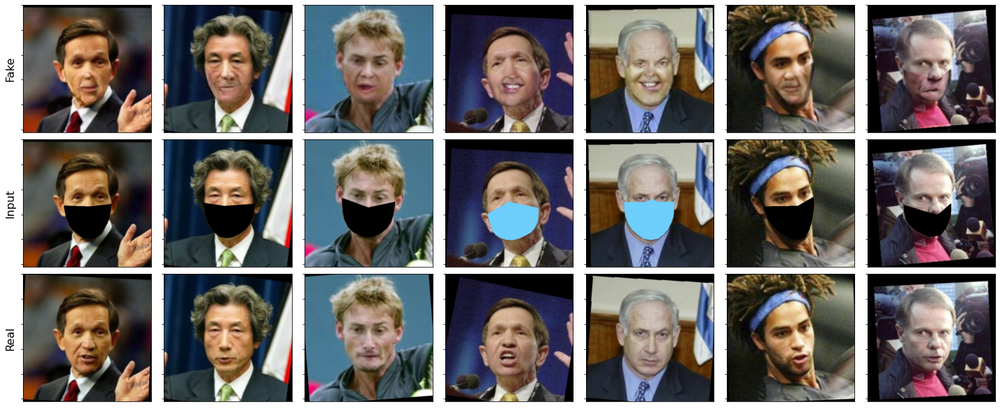

In [76]:
vis_df_results(n_samples,  output_gan = mask2unmask_real, input_gan = unmask2mask_real, real_data = unmask2mask_fake, rand = random)

----------------------------------------------------------------------------------------------

### from Naked to Masked

In [79]:
type_model = "new_resnet_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "masked.pt"
model_path = os.path.join(dir_pretrained, model_name)

model, scores = torch.load(model_path)

#Masked Fake
test_accuracy(dl_unmask2mask_fake, model)

100%|██████████| 16/16 [00:01<00:00, 14.76it/s]


	Number of matches: 347, Number of samples: 500, Accuracy: 0.6940


In [123]:
### VGG

type_model = "new_vgg_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "masked.pt"
model_path = os.path.join(dir_pretrained, model_name)

model, scores, history = torch.load(model_path)

#Masked Fake
test_accuracy(dl_unmask2mask_fake, model)

100%|██████████| 16/16 [00:01<00:00,  9.36it/s]


	Number of matches: 333, Number of samples: 500, Accuracy: 0.6660


In [80]:
# mask2unmask, unmask2mask
target_dset = unmask2mask

n_samples = 7
max_samples = 300

random = np.random.randint(low = 1, high = max_samples, size = n_samples)

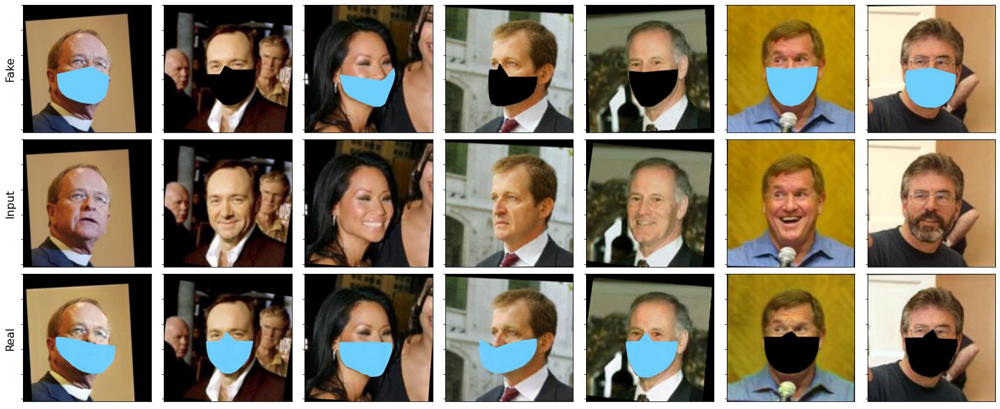

In [81]:
vis_df_results(n_samples,  output_gan = mask2unmask_fake, input_gan = mask2unmask_real, real_data = unmask2mask_real, rand = random)

----------------------------------------------------------------------

### Heatmaps Visualization

We would like to visualize the heatmaps of our ResNet18 classifier using Gram-CAM technique


In [301]:
name_to_idx = {'Abdullah Gul': 281, 'Adrien Brody': 82, 'Ahmed Chalabi': 40,
 'Ai Sugiyama': 193,
 'Al Gore': 110,
 'Al Sharpton': 230,
 'Alan Greenspan': 123,
 'Alastair Campbell': 205,
 'Albert Costa': 216,
 'Alejandro Toledo': 234,
 'Ali Naimi': 208,
 'Allyson Felix': 319,
 'Alvaro Uribe': 264,
 'Amelia Vega': 15,
 'Amelie Mauresmo': 332,
 'Ana Guevara': 240,
 'Ana Palacio': 303,
 'Andre Agassi': 383,
 'Andy Roddick': 45,
 'Angela Bassett': 3,
 'Angela Merkel': 50,
 'Angelina Jolie': 346,
 'Ann Veneman': 356,
 'Anna Kournikova': 149,
 'Antonio Banderas': 256,
 'Antonio Palocci': 76,
 'Ari Fleischer': 297,
 'Ariel Sharon': 288,
 'Arminio Fraga': 113,
 'Arnold Schwarzenegger': 365,
 'Arnoldo Aleman': 238,
 'Ashanti': 414,
 'Atal Bihari Vajpayee': 112,
 'Ben Affleck': 201,
 'Benazir Bhutto': 172,
 'Benjamin Netanyahu': 27,
 'Bernard Law': 183,
 'Bertie Ahern': 168,
 'Bill Clinton': 203,
 'Bill Frist': 243,
 'Bill Gates': 382,
 'Bill Graham': 272,
 'Bill McBride': 13,
 'Bill Simon': 23,
 'Billy Crystal': 143,
 'Binyamin Ben-Eliezer': 337,
 'Bob Graham': 257,
 'Bob Hope': 381,
 'Bob Stoops': 67,
 'Boris Becker': 120,
 'Brad Johnson': 61,
 'Britney Spears': 293,
 'Bulent Ecevit': 389,
 'Calista Flockhart': 135,
 'Cameron Diaz': 192,
 'Carla Del Ponte': 329,
 'Carlos Menem': 279,
 'Carlos Moya': 174,
 'Carmen Electra': 65,
 'Carrie-Anne Moss': 354,
 'Catherine Deneuve': 43,
 'Catherine Zeta-Jones': 361,
 'Celine Dion': 188,
 'Cesar Gaviria': 196,
 'Chanda Rubin': 74,
 'Charles Moose': 200,
 'Charles Taylor': 176,
 'Charlton Heston': 144,
 'Chen Shui-bian': 343,
 'Choi Sung-hong': 412,
 'Christine Baumgartner': 148,
 'Christine Todd Whitman': 349,
 'Ciro Gomes': 311,
 'Clara Harris': 223,
 'Claudia Pechstein': 278,
 'Clay Aiken': 116,
 'Clint Eastwood': 287,
 'Colin Farrell': 189,
 'Colin Montgomerie': 210,
 'Colin Powell': 14,
 'Condoleezza Rice': 315,
 'Costas Simitis': 26,
 'Cruz Bustamante': 153,
 'David Anderson': 167,
 'David Beckham': 80,
 'David Heymann': 222,
 'David Nalbandian': 64,
 'David Trimble': 248,
 'David Wells': 211,
 'Dennis Hastert': 165,
 'Dennis Kucinich': 325,
 'Denzel Washington': 206,
 'Diana Krall': 411,
 'Dick Cheney': 132,
 'Dominique de Villepin': 316,
 'Donald Rumsfeld': 180,
 'Edmund Stoiber': 302,
 'Eduard Shevardnadze': 0,
 'Eduardo Duhalde': 417,
 'Edward Lu': 392,
 'Elizabeth Hurley': 390,
 'Elizabeth Smart': 44,
 'Elsa Zylberstein': 286,
 'Elton John': 260,
 'Emanuel Ginobili': 155,
 'Emma Watson': 21,
 'Enrique Bolanos': 338,
 'Erika Harold': 137,
 'Fernando Gonzalez': 119,
 'Fernando Henrique Cardoso': 263,
 'Fidel Castro': 301,
 'Frank Solich': 326,
 'Fujio Cho': 226,
 'Gene Robinson': 402,
 'Geoff Hoon': 131,
 'George Clooney': 410,
 'George HW Bush': 57,
 'George Lopez': 404,
 'George Pataki': 289,
 'George Robertson': 396,
 'George W Bush': 371,
 'Gerhard Schroeder': 150,
 'Gerry Adams': 237,
 'Gil de Ferran': 274,
 'Gloria Macapagal Arroyo': 58,
 'Goldie Hawn': 318,
 'Gonzalo Sanchez de Lozada': 357,
 'Gordon Brown': 2,
 'Grant Hackett': 147,
 'Gray Davis': 330,
 'Gregg Popovich': 295,
 'Guillermo Coria': 334,
 'Gunter Pleuger': 125,
 'Gwyneth Paltrow': 36,
 'Habib Rizieq': 199,
 'Hal Gehman': 242,
 'Halle Berry': 33,
 'Hamid Karzai': 75,
 'Hans Blix': 96,
 'Harrison Ford': 251,
 'Heidi Klum': 273,
 'Heizo Takenaka': 342,
 'Hillary Clinton': 32,
 'Hitomi Soga': 291,
 'Holly Hunter': 114,
 'Hosni Mubarak': 304,
 'Howard Dean': 51,
 'Hu Jintao': 10,
 'Hugh Grant': 140,
 'Hugo Chavez': 62,
 'Ian Thorpe': 420,
 'Igor Ivanov': 121,
 'JK Rowling': 340,
 'Jack Straw': 106,
 'Jackie Chan': 393,
 'Jacques Chirac': 181,
 'Jacques Rogge': 265,
 'Jake Gyllenhaal': 169,
 'James Blake': 190,
 'James Kelly': 157,
 'James Wolfensohn': 271,
 'Jan Ullrich': 93,
 'Jason Kidd': 38,
 'Javier Solana': 177,
 'Jay Garner': 191,
 'Jean Charest': 232,
 'Jean Chretien': 98,
 'Jean-David Levitte': 186,
 'Jean-Pierre Raffarin': 233,
 'Jeb Bush': 384,
 'Jelena Dokic': 422,
 'Jennifer Aniston': 258,
 'Jennifer Capriati': 385,
 'Jennifer Garner': 108,
 'Jennifer Lopez': 142,
 'Jeong Se-hyun': 418,
 'Jeremy Greenstock': 369,
 'Jesse Jackson': 109,
 'Jiang Zemin': 350,
 'Jim Furyk': 215,
 'Jimmy Carter': 22,
 'Jiri Novak': 92,
 'Joan Laporta': 241,
 'Joe Lieberman': 84,
 'John Abizaid': 245,
 'John Allen Muhammad': 244,
 'John Ashcroft': 87,
 'John Bolton': 398,
 'John Edwards': 395,
 'John Howard': 309,
 'John Kerry': 151,
 'John Manley': 416,
 'John McCain': 53,
 'John Negroponte': 25,
 'John Paul II': 345,
 'John Snow': 179,
 'John Stockton': 79,
 'John Travolta': 90,
 'Jon Gruden': 373,
 'Jonathan Edwards': 170,
 'Joschka Fischer': 6,
 'Jose Manuel Durao Barroso': 164,
 'Jose Maria Aznar': 246,
 'Jose Serra': 31,
 'Joseph Biden': 403,
 'Juan Carlos Ferrero': 413,
 'Juan Pablo Montoya': 220,
 'Julianne Moore': 299,
 'Julie Gerberding': 353,
 'Junichiro Koizumi': 327,
 'Justin Timberlake': 194,
 'Justine Pasek': 290,
 'Kalpana Chawla': 372,
 'Kamal Kharrazi': 307,
 'Kate Hudson': 107,
 'Keanu Reeves': 229,
 'Kevin Costner': 72,
 'Kevin Spacey': 314,
 'Kim Clijsters': 56,
 'Kim Dae-jung': 266,
 'Kim Ryong-sung': 171,
 'King Abdullah II': 218,
 'Kofi Annan': 267,
 'Kristanna Loken': 46,
 'Kurt Warner': 366,
 'Lance Armstrong': 115,
 'Lance Bass': 47,
 'Larry Brown': 344,
 'Laura Bush': 322,
 'LeBron James': 336,
 'Leonardo DiCaprio': 399,
 'Leonid Kuchma': 282,
 'Li Peng': 12,
 'Li Zhaoxing': 139,
 'Lindsay Davenport': 37,
 'Liza Minnelli': 380,
 'Lleyton Hewitt': 375,
 'Lucio Gutierrez': 70,
 'Lucy Liu': 308,
 'Ludivine Sagnier': 41,
 'Luis Ernesto Derbez Bautista': 94,
 'Luis Gonzalez Macchi': 4,
 'Luis Horna': 300,
 'Luiz Inacio Lula da Silva': 409,
 'Madonna': 28,
 'Mahathir Mohamad': 247,
 'Mahmoud Abbas': 252,
 'Marcelo Rios': 91,
 'Marco Antonio Barrera': 359,
 'Maria Shriver': 213,
 'Maria Soledad Alvear Valenzuela': 219,
 'Mariah Carey': 39,
 'Mark Hurlbert': 317,
 'Mark Philippoussis': 111,
 'Martha Stewart': 60,
 'Martin McGuinness': 370,
 'Martin Scorsese': 35,
 'Martina McBride': 253,
 'Matthew Perry': 182,
 'Megawati Sukarnoputri': 159,
 'Meryl Streep': 261,
 'Michael Bloomberg': 154,
 'Michael Chang': 296,
 'Michael Chiklis': 269,
 'Michael Douglas': 250,
 'Michael Jackson': 294,
 'Michael Phelps': 99,
 'Michael Powell': 20,
 'Michael Schumacher': 9,
 'Michelle Kwan': 141,
 'Michelle Yeoh': 68,
 'Mick Jagger': 341,
 'Mike Krzyzewski': 66,
 'Mike Martz': 118,
 'Mike Myers': 207,
 'Mike Weir': 405,
 'Mireya Moscoso': 18,
 'Mohamed ElBaradei': 227,
 'Mohammad Khatami': 5,
 'Mohammed Al-Douri': 235,
 'Monica Seles': 276,
 'Muhammad Ali': 355,
 'Muhammad Saeed al-Sahhaf': 7,
 'Nadia Petrova': 1,
 'Naji Sabri': 262,
 'Nancy Pelosi': 407,
 'Naomi Watts': 360,
 'Natalie Coughlin': 49,
 'Natalie Maines': 134,
 'Nestor Kirchner': 163,
 'Nia Vardalos': 59,
 'Nicanor Duarte Frutos': 34,
 'Nick Nolte': 71,
 'Nicole Kidman': 364,
 'Norah Jones': 195,
 'Norm Coleman': 224,
 'Oscar De La Hoya': 397,
 'Oswaldo Paya': 197,
 'Pamela Anderson': 88,
 'Paradorn Srichaphan': 374,
 'Paul Bremer': 270,
 'Paul Burrell': 280,
 'Paul Martin': 160,
 'Paul McCartney': 124,
 'Paul ONeill': 30,
 'Paul Wolfowitz': 298,
 'Paula Radcliffe': 351,
 'Pedro Almodovar': 239,
 'Pedro Malan': 97,
 'Pervez Musharraf': 312,
 'Pete Sampras': 175,
 'Peter Struck': 89,
 'Pierce Brosnan': 130,
 'Prince Charles': 305,
 'Princess Caroline': 228,
 'Queen Elizabeth II': 136,
 'Queen Rania': 367,
 'Rainer Schuettler': 202,
 'Ralf Schumacher': 236,
 'Ray Romano': 52,
 'Recep Tayyip Erdogan': 352,
 'Renee Zellweger': 379,
 'Ricardo Lagos': 187,
 'Ricardo Sanchez': 178,
 'Richard Armitage': 255,
 'Richard Gephardt': 283,
 'Richard Gere': 185,
 'Richard Myers': 406,
 'Richard Virenque': 254,
 'Rick Perry': 166,
 'Rob Marshall': 127,
 'Robert Blake': 105,
 'Robert De Niro': 277,
 'Robert Duvall': 73,
 'Robert Kocharian': 103,
 'Robert Mueller': 122,
 'Robert Redford': 368,
 'Robert Zoellick': 156,
 'Roger Federer': 69,
 'Roger Moore': 310,
 'Roh Moo-hyun': 324,
 'Roman Polanski': 391,
 'Romano Prodi': 284,
 'Ron Dittemore': 328,
 'Roy Moore': 347,
 'Rubens Barrichello': 63,
 'Rudolph Giuliani': 321,
 'Russell Simmons': 11,
 'Saddam Hussein': 421,
 'Salma Hayek': 146,
 'Sarah Hughes': 231,
 'Sarah Jessica Parker': 339,
 'Scott McClellan': 394,
 'Scott Peterson': 259,
 'Sean OKeefe': 388,
 'Serena Williams': 313,
 'Sergei Ivanov': 362,
 'Sergey Lavrov': 198,
 'Sergio Vieira De Mello': 408,
 'Sharon Stone': 306,
 'Sheryl Crow': 209,
 'Shimon Peres': 145,
 'Silvan Shalom': 101,
 'Silvio Berlusconi': 331,
 'Sophia Loren': 161,
 'Sourav Ganguly': 162,
 'Spencer Abraham': 387,
 'Steffi Graf': 363,
 'Steve Lavin': 48,
 'Steve Nash': 323,
 'Steven Spielberg': 249,
 'Susan Sarandon': 173,
 'Sylvester Stallone': 320,
 'Taha Yassin Ramadan': 285,
 'Tang Jiaxuan': 19,
 'Tariq Aziz': 386,
 'Thabo Mbeki': 78,
 'Thaksin Shinawatra': 221,
 'Thomas OBrien': 95,
 'Tiger Woods': 81,
 'Tim Henman': 419,
 'Tim Robbins': 378,
 'Tom Crean': 126,
 'Tom Cruise': 275,
 'Tom Daschle': 100,
 'Tom Hanks': 212,
 'Tom Harkin': 225,
 'Tom Ridge': 184,
 'Tommy Franks': 24,
 'Tommy Haas': 102,
 'Tommy Thompson': 129,
 'Tony Blair': 401,
 'Tony Stewart': 86,
 'Trent Lott': 104,
 'Tung Chee-hwa': 214,
 'Vaclav Havel': 8,
 'Valentino Rossi': 333,
 'Valery Giscard dEstaing': 152,
 'Vanessa Redgrave': 117,
 'Venus Williams': 42,
 'Vicente Fernandez': 55,
 'Vicente Fox': 158,
 'Victoria Clarke': 83,
 'Vincent Brooks': 415,
 'Vladimir Putin': 358,
 'Vojislav Kostunica': 77,
 'Walter Mondale': 128,
 'Wayne Ferreira': 29,
 'Wen Jiabao': 348,
 'William Donaldson': 16,
 'William Ford Jr': 204,
 'William Macy': 217,
 'Winona Ryder': 17,
 'Woody Allen': 377,
 'Xanana Gusmao': 54,
 'Xavier Malisse': 335,
 'Yao Ming': 138,
 'Yashwant Sinha': 376,
 'Yasser Arafat': 85,
 'Yoko Ono': 268,
 'Yoriko Kawaguchi': 400,
 'Zhu Rongji': 133,
 'Zinedine Zidane': 292}

In [125]:
!pip install grad-cam

In [139]:
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision.models import resnet50

In [144]:
from PIL import Image

def vis_gra_cam(model, input_tensor, target_layers, use_cuda = True, nbr_classes = 422):

    # Construct the CAM object once, and then re-use it on many images:
    cam = GradCAM(model=model, target_layers=target_layers, use_cuda=use_cuda)

    # You can also use it within a with statement, to make sure it is freed,
    # In case you need to re-create it inside an outer loop:
    # with GradCAM(model=model, target_layers=target_layers, use_cuda=args.use_cuda) as cam:
    #   ...

    # If target_category is None, the highest scoring category
    # will be used for every image in the batch.
    # target_category can also be an integer, or a list of different integers
    # for every image in the batch.
    target_category = None

    # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
    grayscale_cam = cam(input_tensor=input_tensor, target_category=target_category, aug_smooth=True, eigen_smooth=True)

    # In this example grayscale_cam has only one image in the batch:
    grayscale_cam = grayscale_cam[0, :]
    rgb_img = torch.swapaxes(torch.swapaxes(input_tensor, 1, 2), 2, 3)
    
    rgb_img = Image.fromarray(rgb_img[0].cpu().numpy().astype(np.uint8))
    #rgb_img = rgb_img / 255
    rgb_img = np.array(rgb_img)
    rgb_img = rgb_img.astype(np.float32)
    rgb_img = rgb_img / 255
    visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)
    
    return visualization

In [172]:
def plot_cams(input_tensor, labels, model1, preds_y, model2, preds_y2, samples = 5):
    fig, ax = plt.subplots(3, samples, figsize = (15, 10))

    for i in range(samples):
        sample = torch.swapaxes(torch.swapaxes(input_tensor[i], 0, 1), 1, 2)
        
        # list out keys and values separately
        key_list = list(name_to_idx.keys())
        val_list = list(name_to_idx.values())
        
        name_celeb = val_list.index(labels[i].numpy())
        ax[0][i].set_title(key_list[name_celeb])
        ax[0][i].imshow(sample)

        #Smoothing is activated

        output = vis_gra_cam(model1, input_tensor[i].unsqueeze(0), use_cuda = True, nbr_classes = len(key_list), target_layers = [model.layer4[-1]])
        output2 = vis_gra_cam(model2, input_tensor[i].unsqueeze(0), use_cuda = True, nbr_classes = len(key_list), target_layers = [model2.features[-1]])
        
        name_celeb = val_list.index(preds_y[i].numpy())
        name_celeb2 = val_list.index(preds_y2[i].numpy())
        
        plt.setp(ax[0][i].get_xticklabels(), visible=False)
        plt.setp(ax[0][i].get_yticklabels(), visible=False)
        ax[0][i].tick_params(axis='both', which='both', length=0)
        
        plt.setp(ax[1][i].get_xticklabels(), visible=False)
        plt.setp(ax[1][i].get_yticklabels(), visible=False)
        ax[1][i].tick_params(axis='both', which='both', length=0)
        
        plt.setp(ax[2][i].get_xticklabels(), visible=False)
        plt.setp(ax[2][i].get_yticklabels(), visible=False)
        ax[2][i].tick_params(axis='both', which='both', length=0)
        
        ax[1][i].set_title(key_list[name_celeb])
        ax[1][0].set_ylabel("ResNet18")
        ax[1][i].imshow(output)
        
        ax[2][i].set_title(key_list[name_celeb2])
        ax[2][0].set_ylabel("VGG16")
        ax[2][i].imshow(output2)
        
    plt.subplots_adjust(wspace=0.1, hspace=-0.10)

> - General Model: Model trained on both Naked/Masked faces

In [175]:
type_model = "new_resnet_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "general.pt"
model_path = os.path.join(dir_pretrained, model_name)

model, scores, history = torch.load(model_path)

type_model = "new_vgg_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "general.pt"
model_path = os.path.join(dir_pretrained, model_name)

model2, scores, history = torch.load(model_path)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


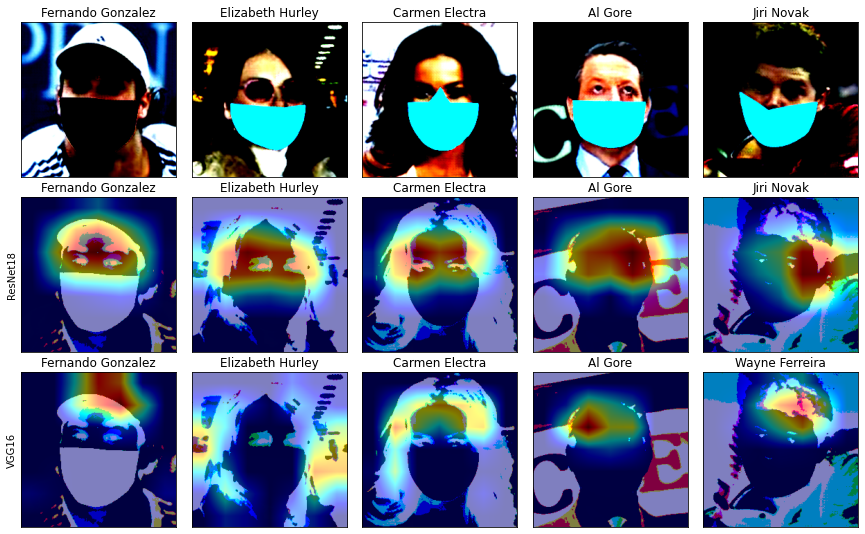

In [176]:
# Mask2Unmasked Fake
i_tensor, labels = next(iter(dl_mask2unmask_fake))
samples = 5

model = model.cuda()
with torch.no_grad():
    inputs = i_tensor.cuda()
    preds = model(inputs)
    pred_y = torch.argmax(preds, dim=-1).cpu()
    
    preds2 = model2(inputs)
    pred_y2 = torch.argmax(preds2, dim=-1).cpu()
    
plot_cams(i_tensor, labels, model, pred_y.cpu(), model2, pred_y2.cpu(), samples = 5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


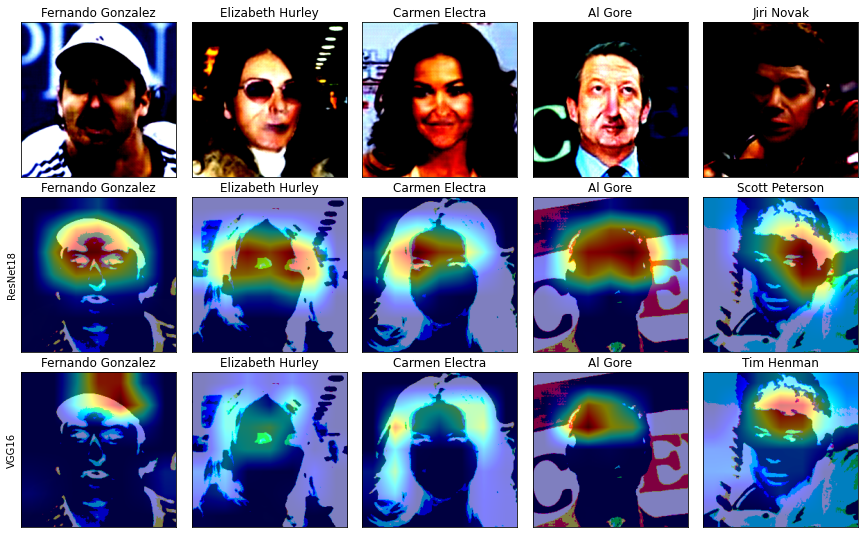

In [177]:
# Unmasked2Mask Fake
i_tensor, labels = next(iter(dl_unmask2mask_fake))
samples = 5
model = model.cuda()

with torch.no_grad():
    inputs = i_tensor.cuda()
    preds = model(inputs)
    pred_y = torch.argmax(preds, dim=-1).cpu()
    
    preds2 = model2(inputs)
    pred_y2 = torch.argmax(preds2, dim=-1).cpu()
    
plot_cams(i_tensor, labels, model, pred_y.cpu(), model2, pred_y2.cpu(), samples = 5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


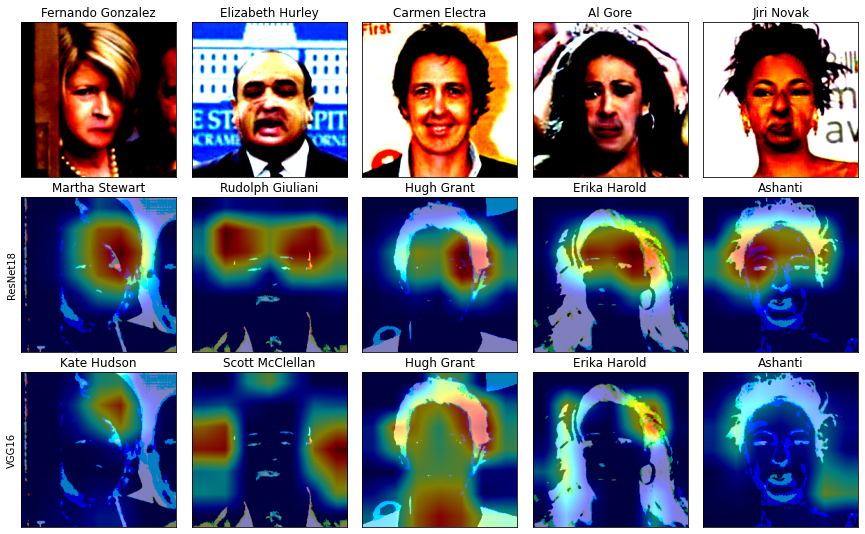

In [178]:
# Mask2Unmasked Fake
i_tensor, labels = next(iter(dl_unmask2mask_fake))
i_tensor = i_tensor[15:]
samples = 5

model = model.cuda()
with torch.no_grad():
    inputs = i_tensor.cuda()
    preds = model(inputs)
    pred_y = torch.argmax(preds, dim=-1).cpu()
    
    preds2 = model2(inputs)
    pred_y2 = torch.argmax(preds2, dim=-1).cpu()
    
plot_cams(i_tensor, labels, model, pred_y.cpu(), model2, pred_y2.cpu(), samples = 5)

---------------------------------------------------------------------------------------

> - Masked Model: Model trained on Masked faces

In [180]:
type_model = "new_resnet_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "masked.pt"
model_path = os.path.join(dir_pretrained, model_name)

model, scores = torch.load(model_path)


type_model = "new_vgg_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "masked.pt"
model_path = os.path.join(dir_pretrained, model_name)

model2, scores, history = torch.load(model_path)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


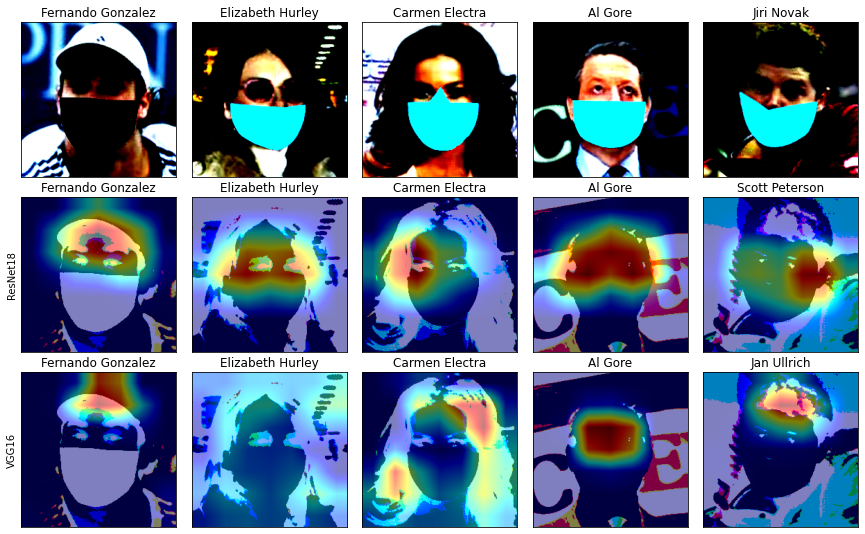

In [181]:
i_tensor, labels = next(iter(dl_mask2unmask_fake))
samples = 5
model = model.cuda()

with torch.no_grad():
    inputs = i_tensor.cuda()
    preds = model(inputs)
    pred_y = torch.argmax(preds, dim=-1).cpu()
    
    preds2 = model2(inputs)
    pred_y2 = torch.argmax(preds2, dim=-1).cpu()
    
plot_cams(i_tensor, labels, model, pred_y.cpu(), model2, pred_y2.cpu(), samples = 5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


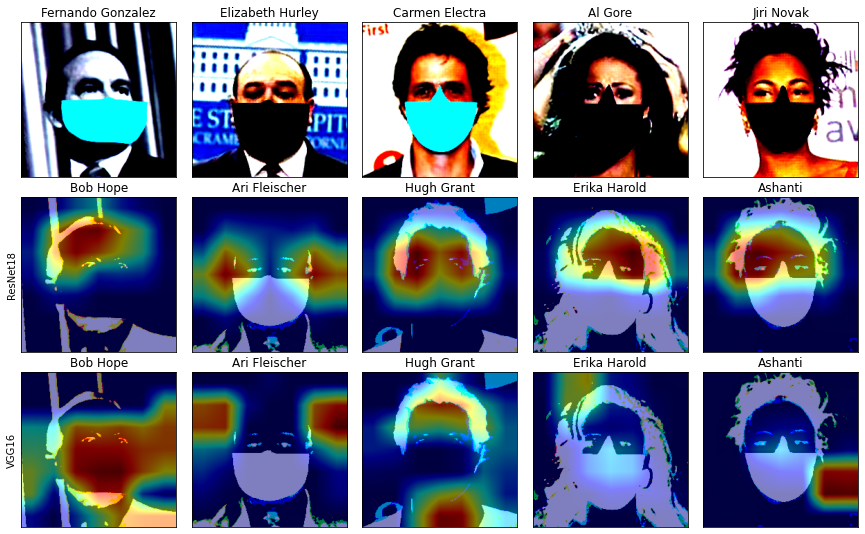

In [182]:
i_tensor, labels = next(iter(dl_mask2unmask_fake))
i_tensor = i_tensor[15:]
samples = 5
model = model.cuda()

with torch.no_grad():
    inputs = i_tensor.cuda()
    preds = model(inputs)
    pred_y = torch.argmax(preds, dim=-1).cpu()
    
    preds2 = model2(inputs)
    pred_y2 = torch.argmax(preds2, dim=-1).cpu()
    
plot_cams(i_tensor, labels, model, pred_y.cpu(), model2, pred_y2.cpu(), samples = 5)

> - Naked Model: Model trained on naked faces

In [183]:
type_model = "new_resnet_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "naked.pt"
model_path = os.path.join(dir_pretrained, model_name)

model, scores, history = torch.load(model_path)

type_model = "new_vgg_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "naked.pt"
model_path = os.path.join(dir_pretrained, model_name)

model2, scores, history = torch.load(model_path)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


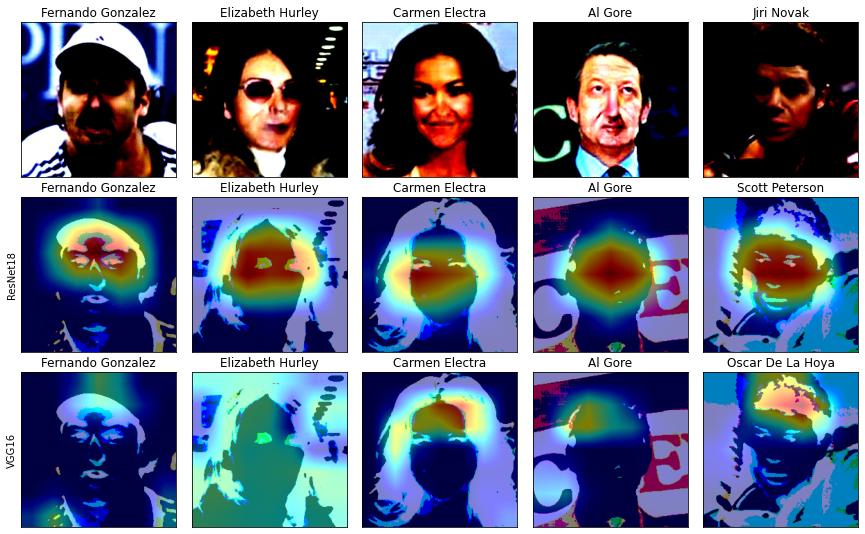

In [184]:
i_tensor, labels = next(iter(dl_unmask2mask_fake))
samples = 5
model = model.cuda()

with torch.no_grad():
    inputs = i_tensor.cuda()
    preds = model(inputs)
    pred_y = torch.argmax(preds, dim=-1).cpu()
    
    preds2 = model2(inputs)
    pred_y2 = torch.argmax(preds2, dim=-1).cpu()
    
plot_cams(i_tensor, labels, model, pred_y.cpu(), model2, pred_y2.cpu(), samples = 5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


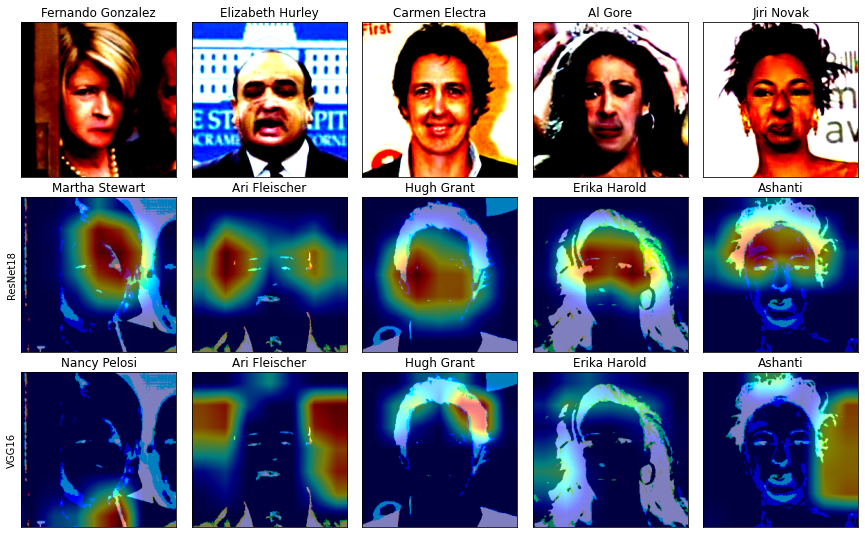

In [185]:
i_tensor, labels = next(iter(dl_unmask2mask_fake))
i_tensor = i_tensor[15:]
samples = 5
model = model.cuda()

with torch.no_grad():
    inputs = i_tensor.cuda()
    preds = model(inputs)
    pred_y = torch.argmax(preds, dim=-1).cpu()
    
    preds2 = model2(inputs)
    pred_y2 = torch.argmax(preds2, dim=-1).cpu()
    
plot_cams(i_tensor, labels, model, pred_y.cpu(), model2, pred_y2.cpu(), samples = 5)

------------------------------------------------------------------------------------

### Evaluating differences Real/Fake

In [353]:
## Results from CycleGAN
cycle_gan_folder = "pytorch-CycleGAN-and-pix2pix"
dataset = "LFW Dataset"
model_trained = "mask2unmask_final2"
masked_to_unmasked = os.path.join(root_path, cycle_gan_folder, "results", model_trained, "test_latest_Masked_toUnmasked")
unmasked_to_masked = os.path.join(root_path, cycle_gan_folder, "results", model_trained, "test_latest_Unmasked_toMasked")

In [354]:
#Getting results from CycleGAN

mask2unmask = extract_files(masked_to_unmasked)[:-1]
unmask2mask = extract_files(unmasked_to_masked)[:-1]

In [356]:
mask2unmask_real, mask2unmask_fake = create_df(mask2unmask)
unmask2mask_real, unmask2mask_fake = create_df(unmask2mask)

/home/imad/anaconda3/envs/inf664/lib/python3.8/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [358]:
def calculateDistance(i1, i2):
    assert len(i1.shape) == len(i2.shape)
    return ((i1-i2)**2).mean()

In [361]:
def vis_diff(fake_cyclegan, real, samples):
    rows, columns = 3, samples
    fig, ax = plt.subplots(rows, columns, figsize = (25, 15))
    
    # Calling merge() function
    df = pd.merge(fake_cyclegan, real, how ='inner', on =['name'])

    for col in range(columns):
        rand = random[col]
        
        output_gan_path = df["fullpath_y"][rand]
        input_gan_path = df["fullpath_x"][rand]
        
        fake_img, input_img = Image.open(output_gan_path), Image.open(input_gan_path)
        error = calculateDistance(np.array(fake_img), np.array(input_img))
        diff = np.array(fake_img) - np.array(input_img)
        
        ax[0][col].imshow(fake_img)
        ax[1][col].imshow(input_img)
        ax[2][col].imshow(diff)

        ax[0][col].axes.get_xaxis().set_visible(False)
        ax[1][col].axes.get_xaxis().set_visible(False)
        ax[2][col].axes.get_xaxis().set_visible(False)

        ax[0][col].axes.get_yaxis().set_visible(True)
        ax[1][col].axes.get_yaxis().set_visible(True)
        ax[2][col].axes.get_yaxis().set_visible(True)

        ax[0][col].set_aspect('equal')
        ax[1][col].set_aspect('equal')
        ax[2][col].set_aspect('equal')

        ax[0][col].set_xticklabels([])
        ax[0][col].set_yticklabels([])

        ax[1][col].set_xticklabels([])
        ax[1][col].set_yticklabels([])
        
        ax[2][col].set_xticklabels([])
        ax[2][col].set_yticklabels([])

        ax[0][0].set_ylabel("Fake", fontsize = 16)
        ax[1][0].set_ylabel("Real", fontsize = 16)
        ax[2][0].set_ylabel("Difference", fontsize = 16)
        ax[2][col].set_title("L2 Distance: {}".format(round(error, 5)))
        
    plt.subplots_adjust(wspace=0.1, hspace=-0.45)

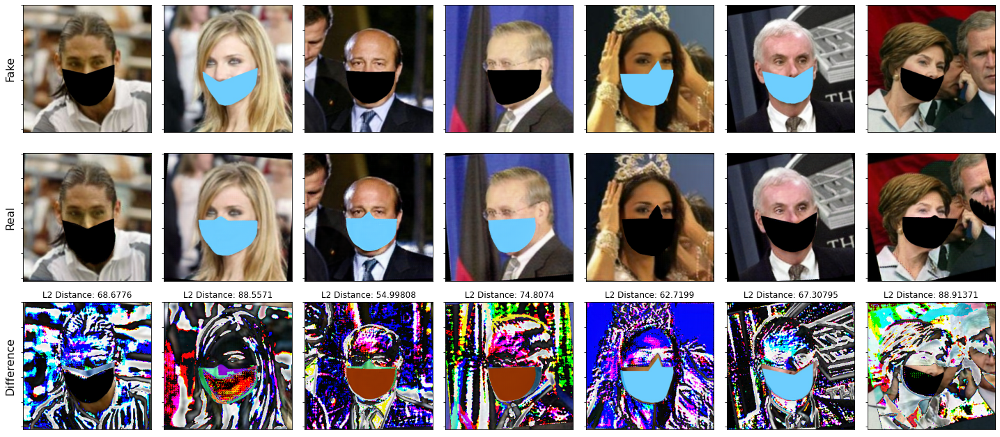

In [362]:
# mask2unmask, unmask2mask
target_dset = unmask2mask
n_samples = 7
random = np.random.randint(low = 1, high = 400, size = n_samples)

vis_diff(mask2unmask_fake, unmask2mask_real, n_samples)

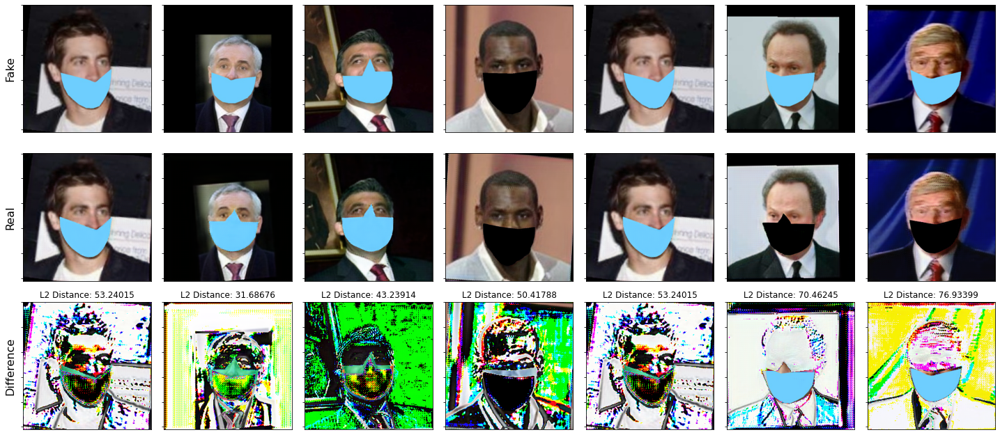

In [363]:
# mask2unmask, unmask2mask
target_dset = unmask2mask
n_samples = 7
random = np.random.randint(low = 1, high = 400, size = n_samples)

vis_diff(mask2unmask_fake, unmask2mask_real, n_samples)

----------------------------------------------------------------------------------------

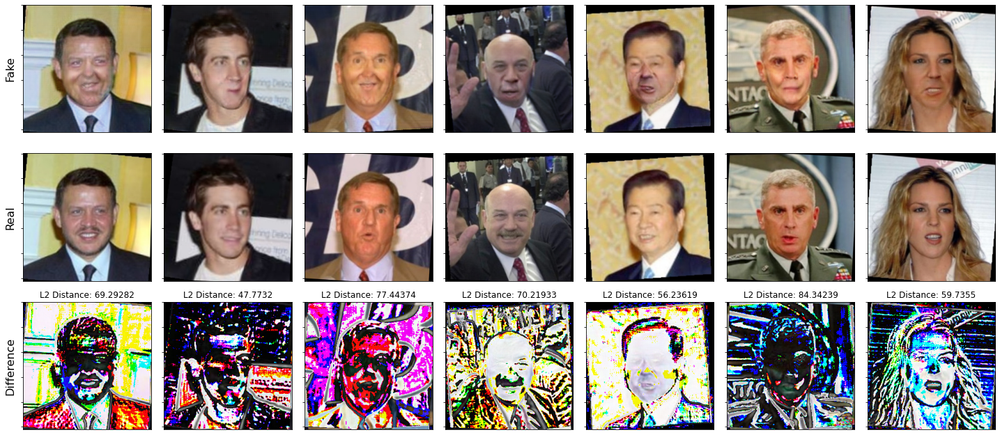

In [666]:
# mask2unmask, unmask2mask
target_dset = unmask2mask
n_samples = 7
random = np.random.randint(low = 1, high = 400, size = n_samples)

vis_diff(mask2unmask_real, unmask2mask_fake, n_samples)

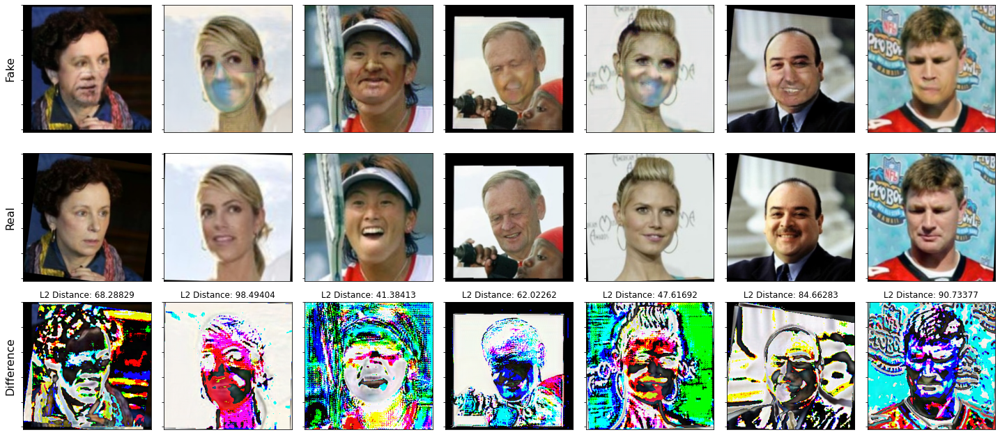

In [667]:
# mask2unmask, unmask2mask
target_dset = unmask2mask
n_samples = 7
random = np.random.randint(low = 1, high = 400, size = n_samples)

vis_diff(mask2unmask_real, unmask2mask_fake, n_samples)

### Analysing results

In [251]:
## Results from CycleGAN
cycle_gan_folder = "pytorch-CycleGAN-and-pix2pix"
dataset = "LFW_dataset"
masked_to_unmasked = os.path.join(root_path, cycle_gan_folder, "datasets", dataset, "trainA")
unmasked_to_masked = os.path.join(root_path, cycle_gan_folder, "datasets", dataset, "trainB")

In [255]:
def extract_files(folder_path):
    paths = []
    for root, dirs, files in os.walk(folder_path, topdown=False):
        for name in files:
            paths.append((root, name))
    return paths

In [257]:
#Getting results from CycleGAN

mask2unmask = extract_files(masked_to_unmasked)
unmask2mask = extract_files(unmasked_to_masked)

In [261]:
mask2unmask_real, _ = create_df(mask2unmask)
unmask2mask_real, _ = create_df(unmask2mask)

/home/imad/anaconda3/envs/inf664/lib/python3.8/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [269]:
samplesA = mask2unmask_real.loc[mask2unmask_real["name"] == "Fernando_Gonzalez"]
samplesB = unmask2mask_real.loc[mask2unmask_real["name"] == "Fernando_Gonzalez"]

In [290]:
def plot_samples(dataframe, name_id = "Fernando_Gonzalez"):
    samples = dataframe.loc[dataframe["name"] == name_id].reset_index()
    fig, ax = plt.subplots(1, len(samples), figsize = (15, 12))
    
    for i in range(len(samples)):
        path = samples["fullpath"][i]
        img = Image.open(path)
        ax[i].axes.get_xaxis().set_visible(False)
        ax[i].axes.get_yaxis().set_visible(False)
        ax[i].imshow(img)
    plt.show()

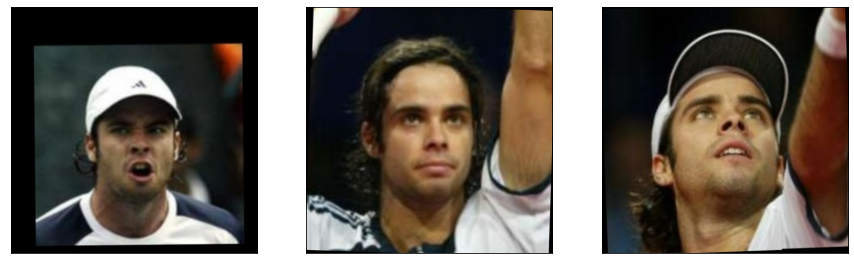

In [291]:
plot_samples(mask2unmask_real, name_id = "Fernando_Gonzalez")

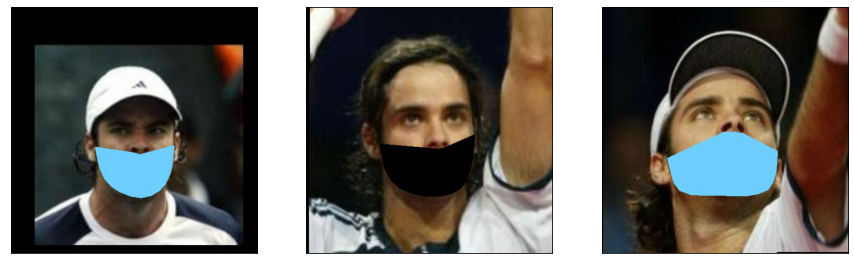

In [292]:
plot_samples(unmask2mask_real, name_id = "Fernando_Gonzalez")

In [302]:
class PandasDataset(Dataset):
    def __init__(self, df: pd.DataFrame, transform=None, target_transform=None,
                 path_col = 'fullpath', label_col = 'name'):
        self.df = df.copy()
        self.img_paths = df[path_col]
        self.labels = df[label_col]
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        path = self.img_paths.iloc[idx]
        image = Image.open(path)
        label = self.labels.iloc[idx]


        if self.transform:
            image = self.transform(image)

        if self.target_transform:
            label = self.target_transform(label)

        return image, label

def tokenize_names(name: str):
    name = name.replace("_", " ")
    return name_to_idx[name]

In [303]:
#Naked Real dataloader
ds_mask2unmask_real = PandasDataset(mask2unmask_real, transform=data_transforms["train"], target_transform=tokenize_names)
dl_mask2unmask_real = torch.utils.data.DataLoader(ds_mask2unmask_real, batch_size=32, shuffle=False, num_workers=4)

#Masked Real dataloader
ds_unmask2mask_real = PandasDataset(unmask2mask_real, transform=data_transforms["train"], target_transform=tokenize_names)
dl_unmask2mask_real = torch.utils.data.DataLoader(ds_unmask2mask_real, batch_size=32, shuffle=False, num_workers=4)

In [304]:
type_model = "new_resnet_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "general.pt"
model_path = os.path.join(dir_pretrained, model_name)

model, scores, history = torch.load(model_path)

type_model = "new_vgg_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "general.pt"
model_path = os.path.join(dir_pretrained, model_name)

model2, scores, history = torch.load(model_path)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


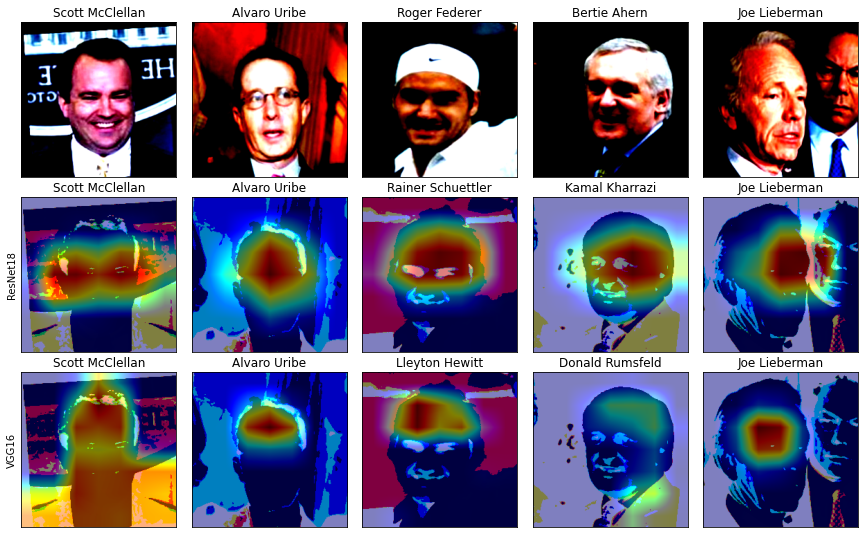

In [305]:
# Mask2Unmasked Real
i_tensor, labels = next(iter(dl_mask2unmask_real))
samples = 5

model = model.cuda()
with torch.no_grad():
    inputs = i_tensor.cuda()
    preds = model(inputs)
    pred_y = torch.argmax(preds, dim=-1).cpu()
    
    preds2 = model2(inputs)
    pred_y2 = torch.argmax(preds2, dim=-1).cpu()
    
plot_cams(i_tensor, labels, model, pred_y.cpu(), model2, pred_y2.cpu(), samples = 5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


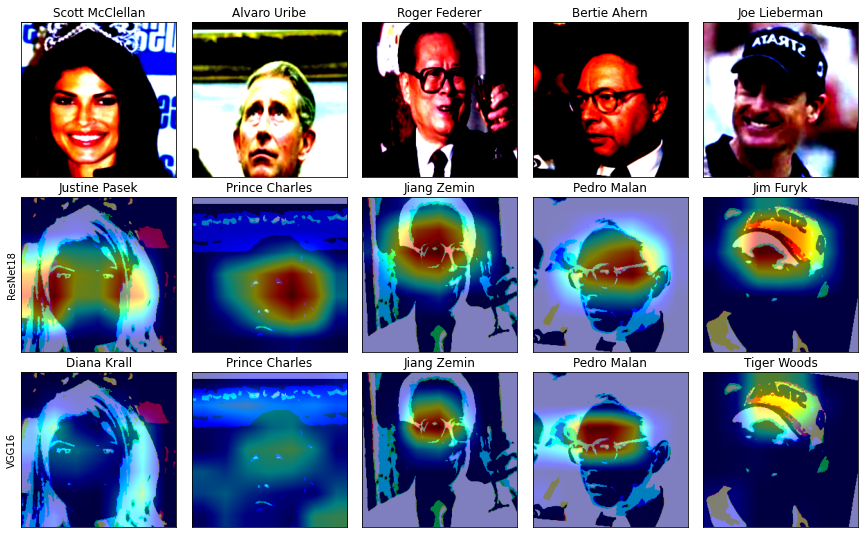

In [306]:
# Mask2Unmasked Real
i_tensor, labels = next(iter(dl_mask2unmask_real))
i_tensor = i_tensor[15:]
samples = 5

model = model.cuda()
with torch.no_grad():
    inputs = i_tensor.cuda()
    preds = model(inputs)
    pred_y = torch.argmax(preds, dim=-1).cpu()
    
    preds2 = model2(inputs)
    pred_y2 = torch.argmax(preds2, dim=-1).cpu()
    
plot_cams(i_tensor, labels, model, pred_y.cpu(), model2, pred_y2.cpu(), samples = 5)

In [327]:
def plot_real_fake(dataframe_real, dataframe_fake, name_id = "Fernando_Gonzalez"):
    samples_real = dataframe_real.loc[dataframe_real["name"] == name_id].reset_index()
    samples_fake = dataframe_fake.loc[dataframe_fake["name"] == name_id].reset_index()
    
    assert len(samples_real) > 0
    fig, ax = plt.subplots(2, len(samples_real), figsize = (15, 12))
    
    for i in range(len(samples_real)):
        path = samples_real["fullpath"][i]
        img = Image.open(path)
        ax[0][i].axes.get_xaxis().set_visible(False)
        ax[0][i].axes.get_yaxis().set_visible(False)
        ax[0][i].imshow(img)
        
        path = samples_fake["fullpath"][i]
        img = Image.open(path)
        ax[1][i].axes.get_xaxis().set_visible(False)
        ax[1][i].axes.get_yaxis().set_visible(False)
        ax[1][i].imshow(img)
    
    plt.subplots_adjust(wspace=0.1, hspace=-0.25)
    plt.show()

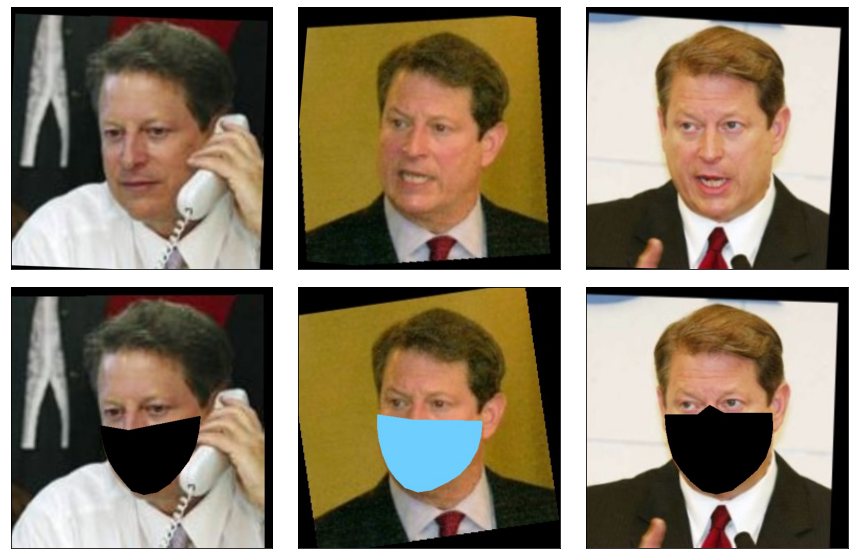

In [329]:
plot_real_fake(mask2unmask_real, unmask2mask_real, name_id = "Al_Gore")

-----------------------------------------------------------------------

In [335]:
pip install image-similarity-measures

     |████████████████████████████████| 2.6 MB 20.0 MB/s eta 0:00:01
     |████████████████████████████████| 60.7 MB 46 kB/s s eta 0:00:01
     |████████████████████████████████| 19.2 MB 26.4 MB/s eta 0:00:01
     |████████████████████████████████| 3.3 MB 102.1 MB/s eta 0:00:01
     |████████████████████████████████| 1.9 MB 102.7 MB/s eta 0:00:01
     |████████████████████████████████| 178 kB 98.0 MB/s eta 0:00:01
     |████████████████████████████████| 6.3 MB 97.2 MB/s eta 0:00:01
  Created wheel for phasepack: filename=phasepack-1.5-py3-none-any.whl size=26984 sha256=e2d8d1bc099cc77ba718f6c54d68ed8c2083036923ec327f9bef649fe097ee47
  Stored in directory: /home/imad/.cache/pip/wheels/c4/c9/8e/6e2318b9f30069caedee0ed0f2e9ac6ba1f3835bd4e779bbe8
Successfully built phasepack
Note: you may need to restart the kernel to use updated packages.


In [336]:
## Results from CycleGAN
cycle_gan_folder = "pytorch-CycleGAN-and-pix2pix"
dataset = "LFW Dataset"
model_trained = "mask2unmask_final2"
masked_to_unmasked = os.path.join(root_path, cycle_gan_folder, "results", model_trained, "test_latest_Masked_toUnmasked")
unmasked_to_masked = os.path.join(root_path, cycle_gan_folder, "results", model_trained, "test_latest_Unmasked_toMasked")

In [337]:
#Getting results from CycleGAN

mask2unmask = extract_files(masked_to_unmasked)[:-1]
unmask2mask = extract_files(unmasked_to_masked)[:-1]

mask2unmask_real, mask2unmask_fake = create_df(mask2unmask)
unmask2mask_real, unmask2mask_fake = create_df(unmask2mask)

/home/imad/anaconda3/envs/inf664/lib/python3.8/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [349]:
img = Image.open(mask2unmask_fake["fullpath"][0])
img1 = Image.open(mask2unmask_fake["fullpath"][4])

In [351]:
img.size, img1.size

((256, 256), (256, 256))

In [348]:
!image-similarity-measures --org_img_path=mask2unmask_fake["fullpath"][0] --pred_img_path=mask2unmask_fake["fullpath"][4]

2021-12-07 22:21:53,741 - image_similarity_measures.evaluate - INFO - Reading image mask2unmask_fake[fullpath][0]
2021-12-07 22:21:53,741 - image_similarity_measures.evaluate - INFO - Reading image mask2unmask_fake[fullpath][4]
Traceback (most recent call last):
  File "/home/imad/anaconda3/envs/inf664/bin/image-similarity-measures", line 8, in <module>
    sys.exit(main())
  File "/home/imad/anaconda3/envs/inf664/lib/python3.8/site-packages/image_similarity_measures/evaluate.py", line 53, in main
    metric_values = evaluation(
  File "/home/imad/anaconda3/envs/inf664/lib/python3.8/site-packages/image_similarity_measures/evaluate.py", line 29, in evaluation
    out_value = float(metric_func(org_img, pred_img))
  File "/home/imad/anaconda3/envs/inf664/lib/python3.8/site-packages/image_similarity_measures/quality_metrics.py", line 49, in psnr
    _assert_image_shapes_equal(org_img, pred_img, "PSNR")
  File "/home/imad/anaconda3/envs/inf664/lib/python3.8/site-packages/image_similarity_me